In [ ]:
# 1. necessary setting
# potential code for advanced analysis
# new anlysis and cell_label
# cell trajectory analysis
import omicverse as ov
#print(f"omicverse version: {ov.__version__}")
import scanpy as sc
#print(f"scanpy version: {sc.__version__}")
ov.utils.ov_plot_set()
sc.settings.set_figure_params(dpi=200, facecolor='white')
import os
import tempfile
import scvi
import seaborn as sns
import torch
scvi.settings.seed = 0
torch.set_float32_matmul_precision("high")
import scvelo as scv

# Core scverse libraries
import scanpy as sc
import anndata as ad

# Data retrieval
import pooch


# 2. Parameter settings

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Define a custom colormap
custom_cmap = LinearSegmentedColormap.from_list(
    'custom_blue_green', ['cyan', 'red'], N=256
)

In [7]:
adata = sc.read_h5ad('D:/AI work/humanAD_filitered_20250103zhang.h5ad')

In [11]:
adata.obs["Group_new"] = adata.obs["Group"].map(
    {
    'High_Tau': 'AD', 
    'Low_Tau': 'AD',  
    'Non_AD': 'Non_AD',       
    }
)

In [ ]:
adata

In [23]:
adata.write_h5ad('D:/AI work/zhang tongmei/output_dir/adata_human_zhang.h5ad')

In [24]:
import scipy.sparse

# Check if the key exists in obsm and convert if it isn’t sparse
if '_scvi_extra_categorical_covs' in adata.obsm:
    if not scipy.sparse.issparse(adata.obsm['_scvi_extra_categorical_covs']):
        adata.obsm['_scvi_extra_categorical_covs'] = scipy.sparse.csr_matrix(adata.obsm['_scvi_extra_categorical_covs'])

# Save the modified AnnData object
adata.write("D:/AI work/zhang tongmei/output_dir2/adata_human_zhang_sparse.h5ad")

In [13]:
import scanpy as sc

# Convert to .h5Seurat format
sc.write(r'D:\AI work\zhang tongmei\output_dir\adata_human_zhang.h5Seurat', adata)

In [ ]:
import scanpy as sc

# Assuming `adata` is your AnnData object
# Find marker genes using rank_genes_groups
sc.tl.rank_genes_groups(adata, groupby="cell_label", method="wilcoxon")

# Get the marker gene results as a DataFrame
markers = sc.get.rank_genes_groups_df(adata, group=None)  # Group=None gives all clusters
markers = markers.rename(columns={"group": "Cluster", "logfoldchanges": "log2FC"})


In [ ]:
markers

In [16]:
# Add a significance filter
markers["Significance"] = markers["pvals_adj"].apply(lambda p: "Significant" if p < 0.01 else "Not Significant")

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize the figure
plt.figure(figsize=(12, 8))

# Create a violin plot for log2FC by cluster
sns.violinplot(data=markers, x="Cluster", y="log2FC", scale="width", inner=None, hue_order=["Significant", "Not Significant"])

# Add a strip plot for individual genes, colored by significance
sns.stripplot(
    data=markers,
    x="Cluster",
    y="log2FC",
    hue="Significance",
    dodge=True,
    jitter=True,
    palette={"Significant": "red", "Not Significant": "blue"},
    alpha=0.7,
    size=3,
)

# Add horizontal line at 0
plt.axhline(0, color="black", linestyle="--")

# Adjust the legend and layout
plt.legend(title="Adjust P-value", loc="upper right", bbox_to_anchor=(1.15, 1))
plt.xticks(rotation=45, ha="right")
plt.title("Marker Genes by Cluster")
plt.tight_layout()
plt.show()

In [18]:
import pandas as pd
import scanpy as sc

# Assuming `adata` is your AnnData object
# Export metadata (obs) to CSV
metadata = adata.obs[['cell_label', 'cell_type', 'Group', 'Group_new']]  # Select relevant columns
metadata.to_csv(r'D:\AI work\zhang tongmei\output_dir\metadata.csv')

# Export counts matrix (X) to CSV
counts = pd.DataFrame(adata.X.toarray(), index=adata.obs_names, columns=adata.var_names)
counts.to_csv(r'D:\AI work\zhang tongmei\output_dir\counts.csv')

# Export gene names (var) to CSV
genes = adata.var_names.to_frame(name='gene')
genes.to_csv(r'D:\AI work\zhang tongmei\output_dir\genes.csv')

In [ ]:
adata

In [22]:
import anndata
import scipy.sparse
import pandas as pd
import numpy as np

def convert_h5ad_to_r(h5ad_path, output_dir="D:/AI work/zhang tongmei/output_dir2"):
    """
    Convert h5ad file to R-compatible format (for Seurat)
    
    Parameters:
    h5ad_path: str, path to input h5ad file
    output_dir: str, directory to save output files (default set to specified path)
    """
    # Read the h5ad file
    print("Reading h5ad file...")
    adata = adata
    
    # Create directory if it doesn't exist
    import os
    os.makedirs(output_dir, exist_ok=True)
    
    # Save expression matrix
    print("Saving expression matrix...")
    if scipy.sparse.issparse(adata.X):
        matrix = adata.X.todense()
    else:
        matrix = adata.X
    
    # Convert to DataFrame with gene names as rows and cell IDs as columns
    exp_df = pd.DataFrame(
        matrix,
        index=adata.var_names,
        columns=adata.obs_names
    )
    
    # Save expression matrix
    exp_df.to_csv(f"{output_dir}/expression_matrix.csv")
    
    # Save metadata (obs)
    print("Saving cell metadata...")
    metadata = adata.obs.copy()
    
    # Ensure Group_new, Group, and cell_type are preserved
    required_columns = ['Group_new', 'Group', 'cell_type','cell_label']
    for col in required_columns:
        if col not in metadata.columns:
            print(f"Warning: {col} not found in metadata")
    
    # Save metadata
    metadata.to_csv(f"{output_dir}/metadata.csv")
    
    # Save feature (gene) information if available
    print("Saving feature information...")
    if len(adata.var) > 0:
        adata.var.to_csv(f"{output_dir}/features.csv")
    
    # Create R script for importing data
    print("Creating R import script...")

In [ ]:
adata

In [36]:
import scipy.sparse as sp

# Convert X to a sparse matrix (if not already sparse)
adata.X = sp.csr_matrix(adata.X)  # or csc_matrix

In [37]:
adata.X = adata.X.astype('float32')  # For sparse matrices, this reduces memory usage

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import scipy.sparse
from statsmodels.stats.multitest import multipletests

def get_de_genes(adata, cell_type_col='cell_label', group_col='Group_new'):
    """
    Perform differential expression analysis between groups for each cell type.
    
    Parameters:
    -----------
    adata : AnnData object
        Your already loaded annotated data matrix
    cell_type_col : str
        Column name in adata.obs containing cell type labels
    group_col : str
        Column name in adata.obs containing group labels
    """
    all_results = []
    
    # Get unique cell types and groups
    cell_types = adata.obs[cell_type_col].unique()
    groups = adata.obs[group_col].unique()
    if len(groups) != 2:
        raise ValueError(f"Expected 2 groups, found {len(groups)}: {groups}")
    
    control, test = groups[0], groups[1]
    print(f"Comparing {test} vs {control}")
    
    for cell_type in cell_types:
        print(f"Processing {cell_type}...")
        
        # Get cell masks
        cell_mask = adata.obs[cell_type_col] == cell_type
        control_mask = adata.obs[group_col] == control
        test_mask = adata.obs[group_col] == test
        
        # Get cell type specific data
        cell_type_data = adata[cell_mask]
        
        # Calculate gene expression frequency
        if scipy.sparse.issparse(cell_type_data.X):
            expr_freq = (cell_type_data.X > 0).sum(axis=0).A1 / cell_type_data.n_obs
        else:
            expr_freq = (cell_type_data.X > 0).sum(axis=0) / cell_type_data.n_obs
            
        # Get genes expressed in at least 10% of cells
        genes_to_test = adata.var_names[expr_freq >= 0.1]
        
        for gene in genes_to_test:
            # Get expression values
            control_exp = adata[cell_mask & control_mask, gene].X
            test_exp = adata[cell_mask & test_mask, gene].X
            
            # Convert to dense array if sparse
            if scipy.sparse.issparse(control_exp):
                control_exp = control_exp.toarray().flatten()
                test_exp = test_exp.toarray().flatten()
            else:
                control_exp = control_exp.flatten()
                test_exp = test_exp.flatten()
            
            if len(control_exp) == 0 or len(test_exp) == 0:
                continue
                
            # Calculate statistics
            avg_control = np.mean(control_exp)
            avg_test = np.mean(test_exp)
            log2fc = np.log2((avg_test + 1e-9) / (avg_control + 1e-9))
            
            # Perform Welch's t-test
            t_stat, p_val = stats.ttest_ind(test_exp, control_exp, equal_var=False)
            
            # Calculate percentage of cells expressing the gene
            pct_1 = np.mean(test_exp > 0) * 100
            pct_2 = np.mean(control_exp > 0) * 100
            
            all_results.append({
                'cluster': cell_type,
                'gene': gene,
                'avg_log2FC': log2fc,
                'p_val': p_val,
                'pct.1': pct_1,
                'pct.2': pct_2
            })
    
    # Create DataFrame and adjust p-values
    results_df = pd.DataFrame(all_results)
    if len(results_df) > 0:
        results_df['p_val_adj'] = multipletests(results_df['p_val'], method='fdr_bh')[1]
    
    return results_df

def plot_de_results(diff_data, pval_thresh=0.05, fc_thresh=0.5, fig_size=(15, 8)):
    """
    Create volcano plot grouped by cell types.
    """
    plt.figure(figsize=fig_size)
    
    # Get unique clusters and set up positions
    clusters = diff_data['cluster'].unique()
    cluster_positions = np.arange(len(clusters))
    
    # Color scheme
    colors = {'up': '#E41A1C', 'down': '#377EB8'}
    
    # Plot each cluster
    for idx, cluster in enumerate(clusters):
        cluster_data = diff_data[diff_data['cluster'] == cluster].copy()
        
        # Add jitter to x-positions
        x_pos = idx + np.random.normal(0, 0.1, len(cluster_data))
        
        # Split into up and down regulated
        sig_mask = cluster_data['p_val_adj'] < pval_thresh
        up_mask = (cluster_data['avg_log2FC'] > 0) & sig_mask
        down_mask = (cluster_data['avg_log2FC'] <= 0) & sig_mask
        
        # Plot points
        plt.scatter(x_pos[up_mask], cluster_data[up_mask]['avg_log2FC'],
                   c=colors['up'], alpha=0.6, s=20, 
                   label='sigUp' if idx == 0 else "")
        plt.scatter(x_pos[down_mask], cluster_data[down_mask]['avg_log2FC'],
                   c=colors['down'], alpha=0.6, s=20, 
                   label='sigDown' if idx == 0 else "")
        
        # Label top significant genes
        sig_genes = cluster_data[
            (abs(cluster_data['avg_log2FC']) > fc_thresh) & 
            (cluster_data['p_val_adj'] < pval_thresh)
        ].sort_values('p_val_adj')
        
        for _, gene in sig_genes.iterrows():
            plt.annotate(gene['gene'],
                        xy=(idx + np.random.normal(0, 0.05), gene['avg_log2FC']),
                        xytext=(5, 5), textcoords='offset points',
                        fontsize=8, ha='left', va='bottom')
    
    # Customize plot
    plt.xlabel('Cell Types')
    plt.ylabel('Average log2 FoldChange')
    plt.title('Differential Expression Analysis by Cell Type')
    plt.xticks(cluster_positions, clusters, rotation=45, ha='right')
    plt.legend(title='Significance', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    
    return plt

# Now you can run these functions with your loaded adata:
de_results = get_de_genes(adata)
plt = plot_de_results(de_results)
plt.show()

In [33]:
del metadata

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np

# Read the data
expression_matrix = pd.read_csv("D:/AD/expression_matrix.csv", index_col=0)
metadata = pd.read_csv("D:/AD/metadata.csv", index_col=0)

# Convert to AnnData object (scanpy's main data structure)
adata = sc.AnnData(X=expression_matrix.T,
                obs=metadata)

# Add UMAP coordinates to adata.obsm
adata.obsm['X_umap'] = metadata[['UMAP_1', 'UMAP_2']].values

# Add cluster info to adata.obs
adata.obs['clusters'] = metadata['seurat_clusters']
adata.obs['group'] = metadata['Group']

In [ ]:
import pandas as pd

chunksize = 10000  # 每次读取 10,000 行
chunks = []

for chunk in pd.read_csv("D:/AD/expression_matrix.csv", index_col=0, chunksize=chunksize):
    chunks.append(chunk)

expression_matrix = pd.concat(chunks)  # 合并所有块
metadata = pd.read_csv("D:/AD/metadata.csv", index_col=0)

# Convert to AnnData object (scanpy's main data structure)
adata = sc.AnnData(X=expression_matrix.T,
                obs=metadata)

# Add UMAP coordinates to adata.obsm
adata.obsm['X_umap'] = metadata[['UMAP_1', 'UMAP_2']].values

# Add cluster info to adata.obs
adata.obs['clusters'] = metadata['seurat_clusters']
adata.obs['group'] = metadata['Group']

In [1]:
# new anlysis and cell_label
# cell trajectory analysis
import omicverse as ov
#print(f"omicverse version: {ov.__version__}")
import scanpy as sc
#print(f"scanpy version: {sc.__version__}")
ov.utils.ov_plot_set()
sc.settings.set_figure_params(dpi=200, facecolor='white')
import os
import tempfile
import scvi
import seaborn as sns
import torch
scvi.settings.seed = 0
torch.set_float32_matmul_precision("high")
import scvelo as scv


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.9, Tutorials: https://omicverse.readthedocs.io/
Dependency error: (pydeseq2 0.4.12 (c:\users\xmlncu\anaconda3\envs\omicverse\lib\site-packages), Requirement.parse('pydeseq2<=0.4.0,>=0.3'))


Seed set to 0


In [2]:
adata = sc.read_h5ad('D:/AI work/humanAD_filitered_20250103zhang.h5ad')

In [3]:
ov.pp.leiden(adata,resolution=0.1)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:20)


In [4]:
marker_genes = ["CDH5","SLC17A7","GAD1","GJA1","CX3CR1","MOG","PDGFRA"]

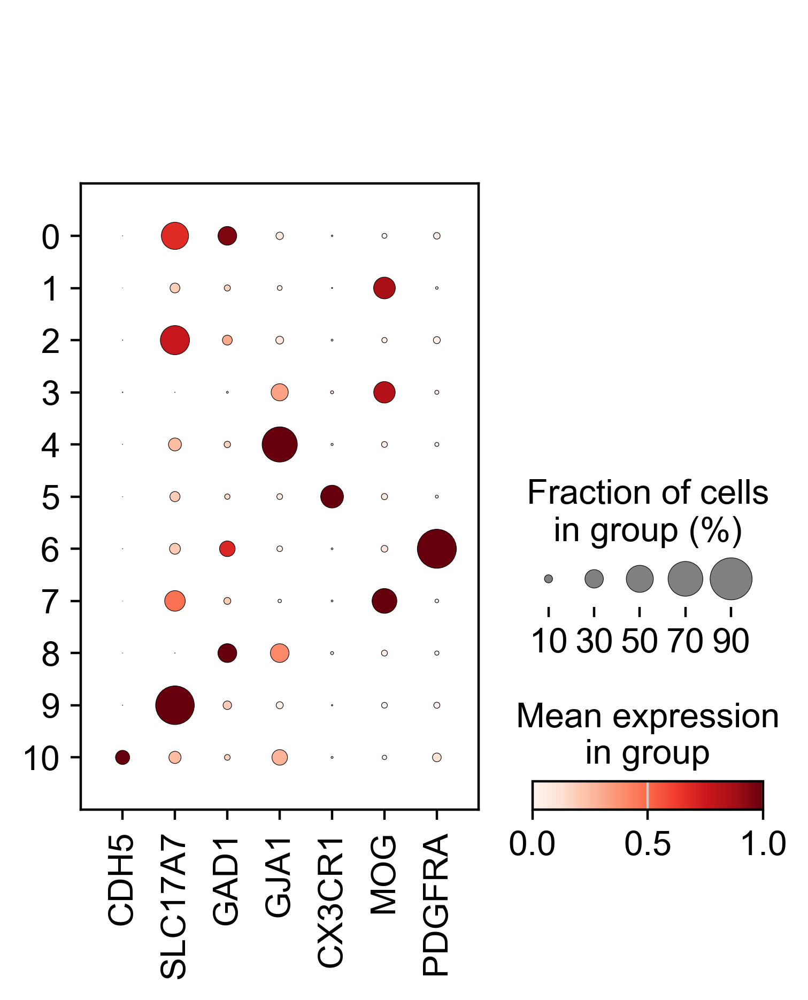

In [5]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden',
             standard_scale='var');

In [6]:
adata.obs["new_cell_type"] = adata.obs["leiden"].map(
    {
    '0': 'Neu_inh',
    '6': 'Neu_inh',
    '8': 'Neu_inh',
    '2': 'Neu_exi',
    '9': 'Neu_exi',
    '1': 'Olig',
    '3': 'Olig',
    '7': 'Olig',
    '6': 'OPC',
    '5': 'Mic',
    '10': 'Vas',
    '4': 'AC',  
    }
)

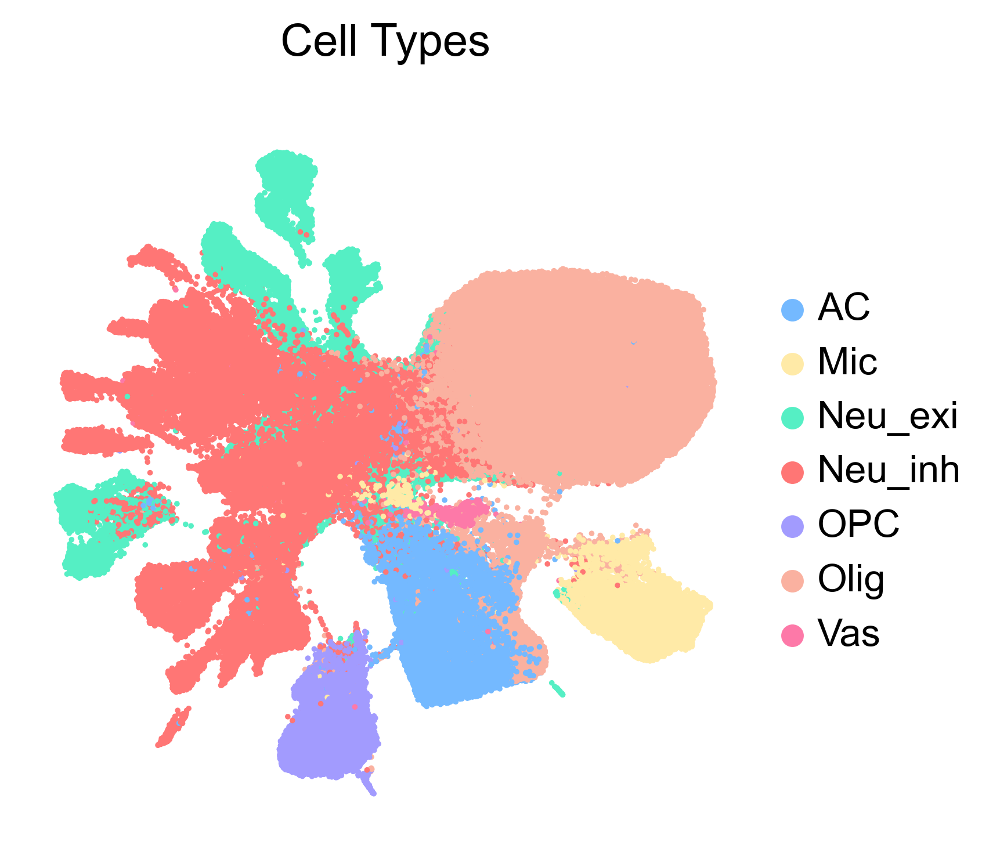

In [8]:
import scanpy as sc
import matplotlib.pyplot as plt

# Define a lighter, more aesthetically pleasing color palette
color_dict = {
    'AC': '#74b9ff',      # light blue
    'Mic': '#ffeaa7',     # light yellow
    'Neu_exi': '#55efc4', # light mint green
    'Neu_inh': '#ff7675', # light coral
    'OPC': '#a29bfe',     # light purple
    'Olig': '#fab1a0',    # light peach
    'Vas': '#fd79a8'      # light pink
}

# Plot UMAP
sc.pl.umap(adata,
           color='new_cell_type',
           palette=color_dict,
           size=12,
           legend_loc='right margin',
           legend_fontsize=12,
           title='Cell Types',
           frameon=False,
           return_fig=True)

# Adjust the figure
plt.title('Cell Types', fontsize=14, pad=20)

# Save the plot
plt.savefig('umap_pretty.pdf', dpi=300, bbox_inches='tight')

In [9]:
adata.obs["Group_new"] = adata.obs["Group"].map(
    {
    'High_Tau': 'AD', 
    'Low_Tau': 'AD',  
    'Non_AD': 'Non_AD',       
    }
)

Dependency error: (pydeseq2 0.4.12 (c:\users\xmlncu\anaconda3\envs\omicverse\lib\site-packages), Requirement.parse('pydeseq2<=0.4.0,>=0.3'))
2025-02-07 19:20:28.360779	Running VIA over input data of 156139 (samples) x 30 (features)
2025-02-07 19:20:28.360779	Knngraph has 15 neighbors
2025-02-07 19:20:50.722042	Finished global pruning of 15-knn graph used for clustering at level of 0.15. Kept 47.4 % of edges. 
2025-02-07 19:20:51.180218	Number of connected components used for clustergraph  is 1
2025-02-07 19:20:53.897378	Commencing community detection
2025-02-07 19:20:56.840411	Finished community detection. Found 5784 clusters.
2025-02-07 19:20:56.865987	Merging 5660 very small clusters (<10)
2025-02-07 19:20:56.908635	Finished detecting communities. Found 124 communities
2025-02-07 19:20:56.914151	Making cluster graph. Global cluster graph pruning level: 0.15
2025-02-07 19:20:57.141287	Graph has 1 connected components before pruning
2025-02-07 19:20:57.146296	Graph has 1 connected comp

  0%|          | 0/1300 [00:00<?, ?it/s]

memory for rw2 hittings times  2. Using rw2 based pt
2025-02-07 19:21:24.678406	Identifying terminal clusters corresponding to unique lineages...
2025-02-07 19:21:24.678406	Closeness:[0, 4, 7, 8, 10, 11, 12, 13, 14, 15, 19, 20, 23, 24, 26, 27, 32, 34, 40, 41, 42, 43, 44, 45, 47, 54, 56, 57, 60, 62, 63, 67, 69, 72, 73, 74, 75, 76, 79, 80, 81, 84, 91, 93, 100, 104, 105, 108, 111, 117, 120]
2025-02-07 19:21:24.678406	Betweenness:[0, 1, 3, 4, 5, 6, 8, 10, 11, 12, 13, 15, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 39, 41, 42, 43, 44, 45, 46, 47, 51, 54, 55, 56, 57, 58, 60, 61, 63, 64, 66, 67, 69, 70, 73, 74, 75, 76, 77, 80, 83, 87, 89, 90, 92, 93, 94, 95, 96, 100, 101, 104, 106, 107, 111, 113, 115, 116, 117, 118, 120, 122]
2025-02-07 19:21:24.678406	Out Degree:[0, 4, 7, 8, 9, 10, 11, 12, 13, 14, 15, 17, 19, 20, 22, 23, 24, 26, 27, 29, 31, 32, 33, 34, 35, 39, 43, 44, 45, 47, 49, 51, 53, 54, 55, 56, 57, 58, 61, 62, 63, 64, 65, 69, 71, 72, 73, 74, 75, 76, 77, 79, 80, 81, 82, 8

  0%|          | 0/1000 [00:00<?, ?it/s]

2025-02-07 19:21:26.606968	Cluster or terminal cell fate 11 is reached 316.0 times
2025-02-07 19:21:26.694729	Cluster or terminal cell fate 15 is reached 353.0 times
2025-02-07 19:21:26.784969	Cluster or terminal cell fate 20 is reached 260.0 times
2025-02-07 19:21:26.883432	Cluster or terminal cell fate 22 is reached 127.0 times
2025-02-07 19:21:26.982811	Cluster or terminal cell fate 29 is reached 70.0 times
2025-02-07 19:21:27.081362	Cluster or terminal cell fate 31 is reached 122.0 times
2025-02-07 19:21:27.186096	Cluster or terminal cell fate 32 is reached 23.0 times
2025-02-07 19:21:27.283801	Cluster or terminal cell fate 33 is reached 119.0 times
2025-02-07 19:21:27.388378	Cluster or terminal cell fate 35 is reached 3.0 times
2025-02-07 19:21:27.482029	Cluster or terminal cell fate 45 is reached 327.0 times
2025-02-07 19:21:27.569203	Cluster or terminal cell fate 47 is reached 371.0 times
2025-02-07 19:21:27.663022	Cluster or terminal cell fate 51 is reached 152.0 times
2025-02-

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |#######################

2025-02-07 19:24:36.754959	Super cluster 11 is a super terminal with sub_terminal cluster 11
2025-02-07 19:24:36.754959	Super cluster 15 is a super terminal with sub_terminal cluster 15
2025-02-07 19:24:36.754959	Super cluster 20 is a super terminal with sub_terminal cluster 20
2025-02-07 19:24:36.754959	Super cluster 22 is a super terminal with sub_terminal cluster 22
2025-02-07 19:24:36.754959	Super cluster 29 is a super terminal with sub_terminal cluster 29
2025-02-07 19:24:36.754959	Super cluster 31 is a super terminal with sub_terminal cluster 31
2025-02-07 19:24:36.754959	Super cluster 32 is a super terminal with sub_terminal cluster 32
2025-02-07 19:24:36.754959	Super cluster 33 is a super terminal with sub_terminal cluster 33
2025-02-07 19:24:36.754959	Super cluster 35 is a super terminal with sub_terminal cluster 35
2025-02-07 19:24:36.754959	Super cluster 45 is a super terminal with sub_terminal cluster 45
2025-02-07 19:24:36.754959	Super cluster 47 is a super terminal with s

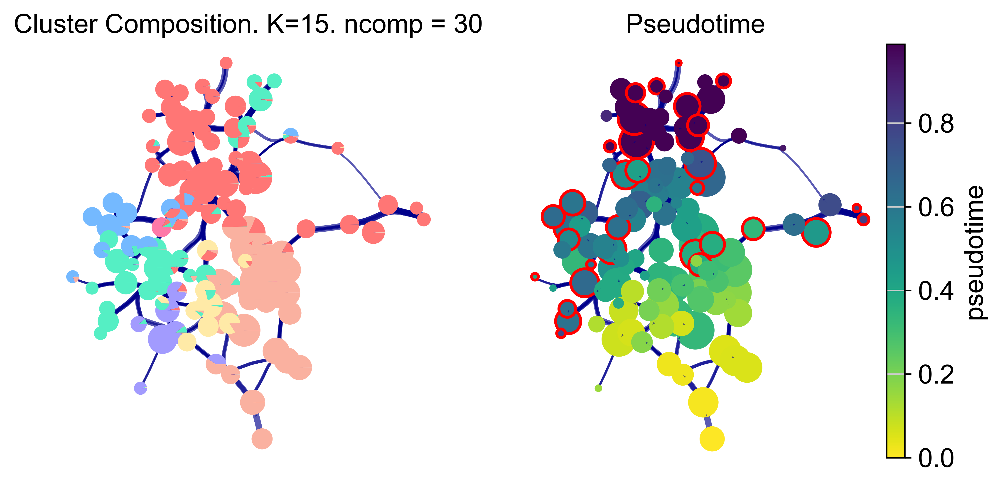

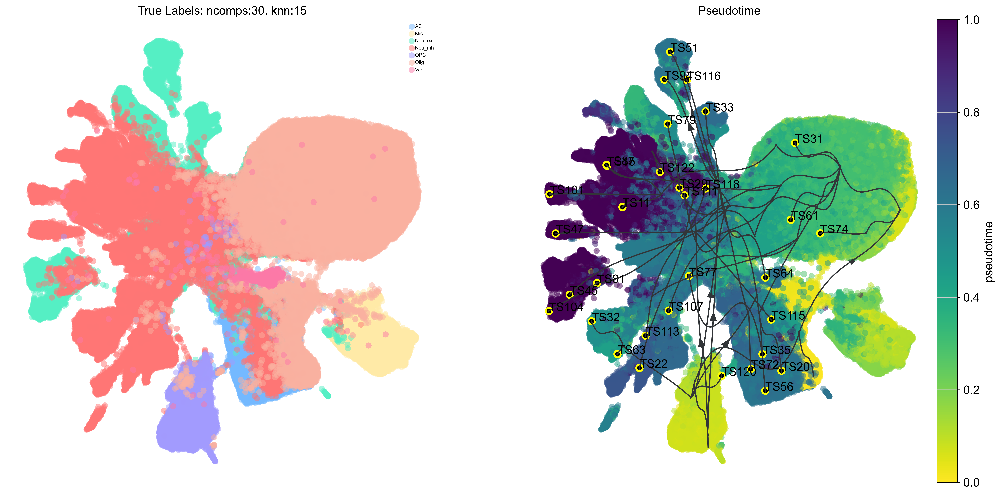

In [11]:
import scanpy as sc
import omicverse as ov
from omicverse.externel import VIA

import matplotlib.pyplot as plt
ov.plot_set()
ncomps=30
knn=15
v0_random_seed=4
root_user = ['Micro'] #the index of a cell belonging to the nIPC cell type
memory = 10
dataset = ''
use_rep = 'scaled|original|X_pca'
clusters = 'new_cell_type'
basis='X_umap'

'''
#NOTE1, if you decide to choose a cell type as a root, then you need to set the dataset as 'group'
#root_user=['HSC1']
#dataset = 'group'# 'humanCD34'
#NOTE2, if rna-velocity is available, considering using it to compute the root automatically- see RNA velocity tutorial
'''

v0 = VIA.core.VIA(data=adata.obsm[use_rep][:, 0:ncomps], 
             true_label=adata.obs[clusters], 
             edgepruning_clustering_resolution=0.15, cluster_graph_pruning=0.15,
             knn=knn,  root_user=root_user, resolution_parameter=1.5,
             dataset=dataset, random_seed=v0_random_seed, memory=memory)#, do_compute_embedding=True, embedding_type='via-atlas')

v0.run_VIA()
fig, ax, ax1 = VIA.core.plot_piechart_viagraph_ov(adata,clusters='new_cell_type',dpi=300,
                                             via_object=v0, ax_text=False,show_legend=False)
fig.set_size_inches(8,4)
clusters='new_cell_type'
color_true_list=adata.uns['{}_colors'.format(clusters)]
fig, ax, ax1 = VIA.core.plot_trajectory_curves_ov(adata,clusters='new_cell_type',dpi=300,
                                                  via_object=v0,embedding=adata.obsm['X_umap'],
                                               draw_all_curves=False)

2025-02-07 19:26:18.314789	Computing Edges
2025-02-07 19:26:18.314789	Start finding milestones
2025-02-07 19:26:31.784614	End milestones with 150
2025-02-07 19:26:32.068794	Recompute weights
2025-02-07 19:26:32.081009	pruning milestone graph based on recomputed weights
2025-02-07 19:26:32.082009	Graph has 1 connected components before pruning
2025-02-07 19:26:32.083008	Graph has 1 connected components after pruning
2025-02-07 19:26:32.083008	Graph has 1 connected components after reconnecting
2025-02-07 19:26:32.084007	regenerate igraph on pruned edges
2025-02-07 19:26:32.173408	Setting numeric label as time_series_labels or other sequential metadata for coloring edges
2025-02-07 19:26:32.389898	Making smooth edges
inside add sc embedding second if


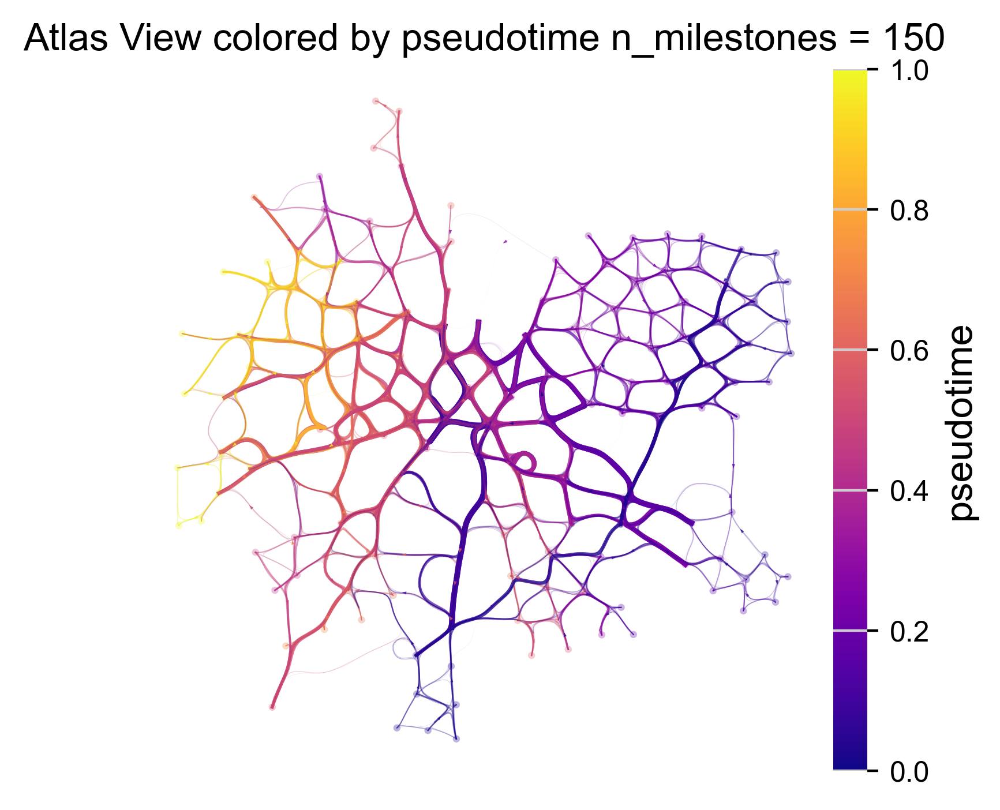

In [12]:
v0.embedding = adata.obsm['X_umap']
fig, ax = VIA.core.plot_atlas_view(via_object=v0, 
                                   n_milestones=150, 
                                   sc_labels=adata.obs['new_cell_type'], 
                                   fontsize_title=12,
                                   fontsize_labels=12,dpi=200,
                                   extra_title_text='Atlas View colored by pseudotime')
fig.set_size_inches(4,4)

2025-02-07 19:27:35.980909	Computing Edges
2025-02-07 19:27:35.980909	Start finding milestones
2025-02-07 19:27:48.344720	End milestones with 150
2025-02-07 19:27:48.668364	Recompute weights
2025-02-07 19:27:48.680765	pruning milestone graph based on recomputed weights
2025-02-07 19:27:48.681766	Graph has 1 connected components before pruning
2025-02-07 19:27:48.681766	Graph has 1 connected components after pruning
2025-02-07 19:27:48.682767	Graph has 1 connected components after reconnecting
2025-02-07 19:27:48.683768	regenerate igraph on pruned edges
2025-02-07 19:27:48.769466	Setting numeric label as time_series_labels or other sequential metadata for coloring edges
2025-02-07 19:27:48.987596	Making smooth edges
inside add sc embedding second if


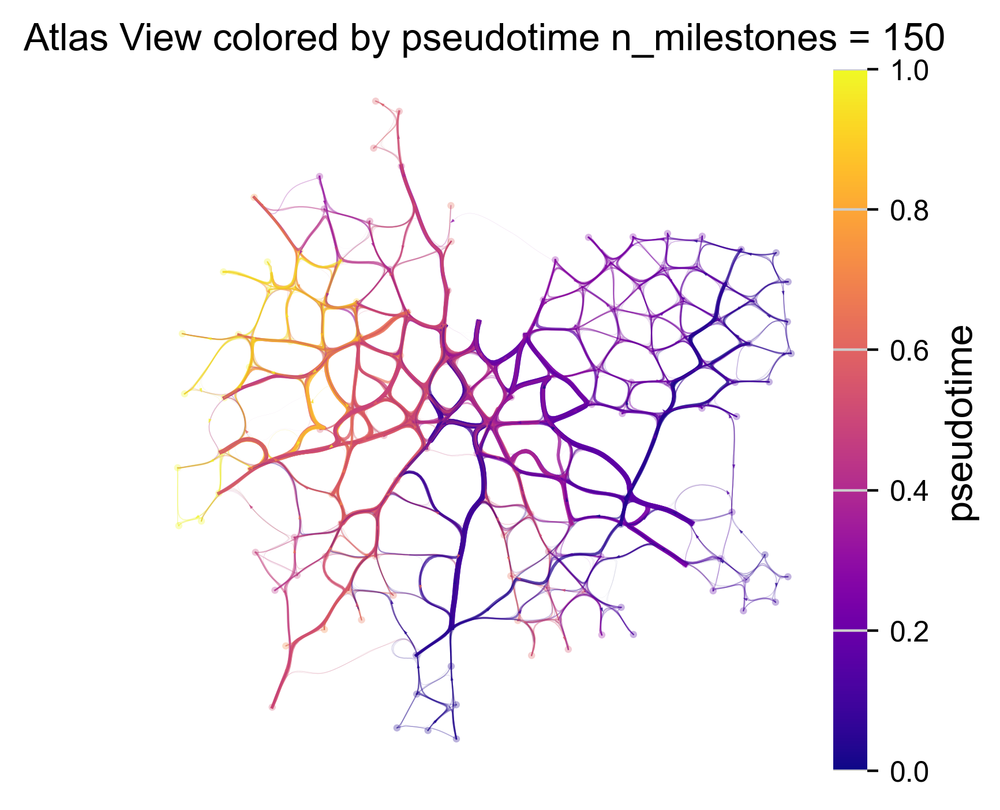

In [13]:
v0.embedding = adata.obsm['X_umap']
fig, ax = VIA.core.plot_atlas_view(via_object=v0, 
                                   n_milestones=150, 
                                   sc_labels=adata.obs['new_cell_type'], 
                                   fontsize_title=12,
                                   fontsize_labels=12,dpi=200,
                                   extra_title_text='Atlas View colored by pseudotime')
fig.set_size_inches(4,4)

In [ ]:
# edge plots can be made with different edge resolutions. Run hammerbundle_milestone_dict() to recompute the edges for plotting. Then provide the new hammerbundle as a parameter to plot_edge_bundle()
# it is better to compute the edges and save them to the via_object. this gives more control to the merging of edges
decay = 0.6 #increasing decay increasing merging of edges
i_bw = 0.02 #increasing bw increases merging of edges
global_visual_pruning = 0.5 #higher number retains more edges
n_milestones = 200

v0.hammerbundle_milestone_dict= VIA.core.make_edgebundle_milestone(via_object=v0, 
                                                              n_milestones=n_milestones, 
                                                              decay=decay, initial_bandwidth=i_bw,
                                                              global_visual_pruning=global_visual_pruning)

In [ ]:
fig, ax = VIA.core.plot_atlas_view(via_object=v0,  
                              add_sc_embedding=True, 
                              sc_labels_expression=adata.obs['new_cell_type'], 
                              cmap='jet', sc_labels=adata.obs['new_cell_type'], 
                              text_labels=True, 
                              extra_title_text='Atlas View by Cell type', 
                              fontsize_labels=3,fontsize_title=3,dpi=300
                             )
fig.set_size_inches(6,4)
# via_streamplot() requires you to either provide an ndarray as embedding as an input parameter OR for via to have an embedding attribute
fig, ax = VIA.core.via_streamplot_ov(adata,'new_cell_type',
                                     v0, embedding=adata.obsm['X_umap'], dpi=300,
                             density_grid=0.8, scatter_size=30, 
                             scatter_alpha=0.3, linewidth=0.5)
fig.set_size_inches(5,5)

2025-02-07 19:30:01.598865	Computing Edges
2025-02-07 19:30:01.598865	Start finding milestones
2025-02-07 19:30:14.700472	End milestones with 150
2025-02-07 19:30:14.995790	Recompute weights
2025-02-07 19:30:15.008259	pruning milestone graph based on recomputed weights
2025-02-07 19:30:15.009258	Graph has 1 connected components before pruning
2025-02-07 19:30:15.010257	Graph has 1 connected components after pruning
2025-02-07 19:30:15.010257	Graph has 1 connected components after reconnecting
2025-02-07 19:30:15.012255	regenerate igraph on pruned edges
2025-02-07 19:30:15.099884	Setting numeric label as time_series_labels or other sequential metadata for coloring edges
2025-02-07 19:30:15.317445	Making smooth edges
inside add sc embedding second if
